# 1. SETTING UP

## 1.1 IMPORTING LIBRARY

In [1]:
import numpy as np
import pandas as pd
import pickle as pkl
import warnings

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import f1_score, make_scorer, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier as SKRF
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import cross_val_score, KFold, train_test_split

warnings.filterwarnings('ignore')
%matplotlib inline

## 1.2 IMPORT DATASET

In [2]:
train_df = pd.read_csv("Data/train.csv")
test_df = pd.read_csv("Data/test.csv")

## 1.3 ENVIRONTMENTAL SETUP

In [3]:
warnings.filterwarnings('ignore')
SEED = 42
TARGET = "economic_day_status"

# 2. EXPLORATORY DATA ANALYSIS (EDA)

## 2.1 DATA UNDERSTANDING

In [4]:
# Missing Data
train_df.isnull().sum()

country_code                     0
region                           0
income_group                     0
trade_balance_status             0
political_stability              0
economic_sector_dominant         0
currency_type                    0
policy_framework                 0
season                       24997
crisis_event                 76000
governance_quality               0
climate_impact_level             0
trade_bloc                       0
financial_access                 0
migration_trend                  0
date                             0
year                             0
quarter                          0
gdp_per_capita                   0
inflation_rate                   0
unemployment_rate                0
interest_rate                    0
exchange_rate                    0
exports_usd                      0
imports_usd                      0
debt_gdp_ratio                   0
investment_pct_gdp               0
consumption_pct_gdp              0
population_million  

Missing value hanya ada pada fitur season dan crisis event. fitur Crisis event nanti akan digunakan pada feature engineering dan season akan digunakan untuk analisis data

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76710 entries, 0 to 76709
Data columns (total 41 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   country_code               76710 non-null  object 
 1   region                     76710 non-null  object 
 2   income_group               76710 non-null  object 
 3   trade_balance_status       76710 non-null  object 
 4   political_stability        76710 non-null  object 
 5   economic_sector_dominant   76710 non-null  object 
 6   currency_type              76710 non-null  object 
 7   policy_framework           76710 non-null  object 
 8   season                     51713 non-null  object 
 9   crisis_event               710 non-null    object 
 10  governance_quality         76710 non-null  object 
 11  climate_impact_level       76710 non-null  object 
 12  trade_bloc                 76710 non-null  object 
 13  financial_access           76710 non-null  obj

In [6]:
train_df.describe()

,year,quarter,gdp_per_capita,inflation_rate,unemployment_rate,interest_rate,exchange_rate,exports_usd,imports_usd,debt_gdp_ratio,...,internet_penetration,energy_consumption_mwh,renewable_energy_pct,income_inequality_gini,education_index,healthcare_index,poverty_rate,fdi_inflows_usd,business_confidence_index,manufacturing_pmi
count,76710.000000,76710.000000,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,...,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04,7.671000e+04
mean,2010.000000,2.508408,-1.422753e-16,-3.484633e-16,-3.881077e-17,-1.629311e-16,-6.361631e-16,1.007783e-16,-4.238618e-16,-1.482034e-17,...,-5.928136e-18,-9.129330e-16,3.853289e-17,2.092447e-16,3.556882e-16,5.572448e-16,-4.149696e-17,2.223051e-16,-3.651362e-16,-1.427940e-15
std,6.055986,1.117135,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,...,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00
min,2000.000000,1.000000,-4.105940e+00,-6.078401e+00,-6.722322e+00,-6.056753e+00,-6.342404e+00,-4.218320e+00,-4.839517e+00,-6.445364e+00,...,-3.478214e+00,-4.695139e+00,-4.055284e+00,-5.090661e+00,-3.507814e+00,-3.841505e+00,-4.970003e+00,-4.858999e+00,-4.424063e+00,-6.609183e+00
25%,2005.000000,2.000000,-6.609496e-01,-5.614675e-01,-5.632261e-01,-5.709924e-01,-5.543777e-01,-6.664607e-01,-6.542742e-01,-5.581502e-01,...,-6.769857e-01,-6.462487e-01,-6.021414e-01,-5.662451e-01,-6.478775e-01,-6.364898e-01,-6.549678e-01,-6.367636e-01,-6.028473e-01,-5.628270e-01
50%,2010.000000,3.000000,4.879693e-03,-5.414307e-03,-3.103681e-03,-3.184219e-03,4.635218e-04,-2.956329e-02,-2.960842e-02,1.925232e-03,...,4.437782e-03,8.940686e-03,-1.433014e-03,1.063964e-03,-1.241021e-02,-5.465314e-04,-2.664440e-03,-3.810459e-02,-5.223728e-03,1.711850e-03
75%,2015.000000,4.000000,6.828436e-01,5.629289e-01,5.586168e-01,5.630055e-01,5.632194e-01,6.298179e-01,6.202896e-01,5.604313e-01,...,6.825869e-01,6.631555e-01,5.939460e-01,5.637577e-01,6.500024e-01,6.414761e-01,6.470866e-01,5.947095e-01,6.010932e-01,5.692584e-01
max,2020.000000,4.000000,3.860621e+00,6.668126e+00,6.544901e+00,7.256529e+00,6.254568e+00,5.719460e+00,5.575239e+00,6.084573e+00,...,2.837014e+00,4.546794e+00,5.806194e+00,6.552426e+00,3.651123e+00,3.834656e+00,4.441823e+00,6.381063e+00,4.655208e+00,6.060130e+00


# 2.2 Data Visualization

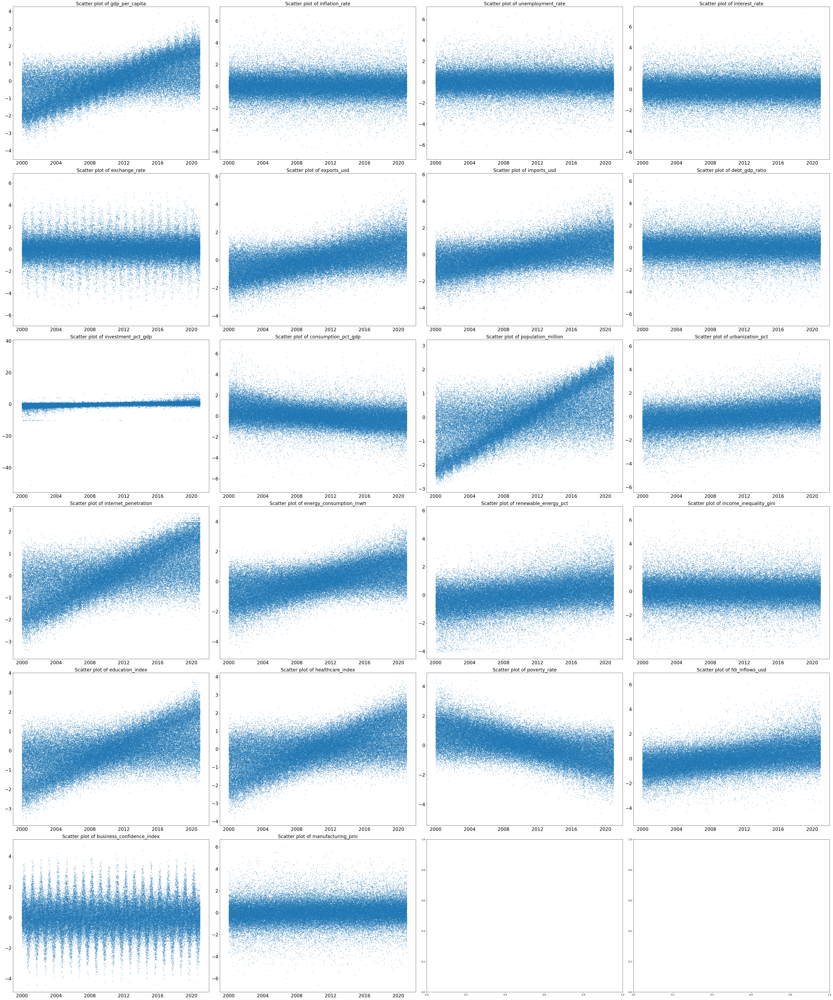

In [7]:
features = [
    "gdp_per_capita",
    "inflation_rate",
    "unemployment_rate",
    "interest_rate",
    "exchange_rate",
    "exports_usd",
    "imports_usd",
    "debt_gdp_ratio",
    "investment_pct_gdp",
    "consumption_pct_gdp",
    "population_million",
    "urbanization_pct",
    "internet_penetration",
    "energy_consumption_mwh",
    "renewable_energy_pct",
    "income_inequality_gini",
    "education_index",
    "healthcare_index",
    "poverty_rate",
    "fdi_inflows_usd",
    "business_confidence_index",
    "manufacturing_pmi"
] 
train_df["date"] = pd.to_datetime(train_df["date"])

fig, ax = plt.subplots(nrows=6,ncols=4, figsize=(50,60))
ax = ax.ravel()
for i, feature in enumerate(features):
    ax[i].set_title(f"Scatter plot of {feature}", size=20)
    ax[i].scatter(x=train_df["date"], y=train_df[feature], alpha=0.4,s=4)
    ax[i].tick_params(axis="x", labelsize=20)
    ax[i].tick_params(axis="y", labelsize=20)

plt.tight_layout()

Dari grafik-grafik diatas dapat terlihat masing-masing fitur yang memikiki pola unik masing-masing

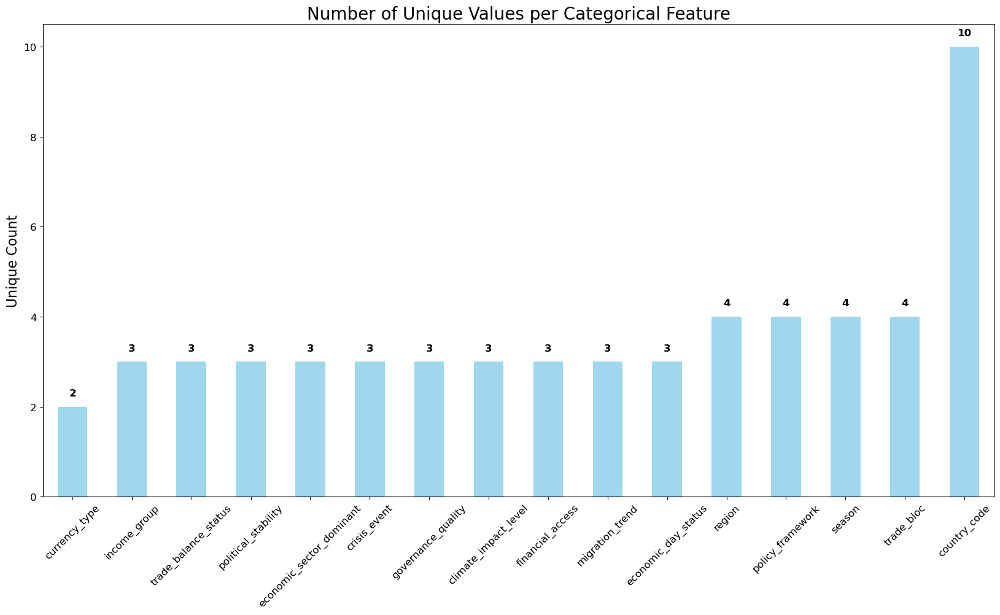

In [8]:
distincts = train_df.select_dtypes(include="object").nunique()

distincts = distincts.sort_values()
ax = distincts.plot(kind="bar", figsize=(20, 10), color="skyblue", alpha=0.8)

for i, val in enumerate(distincts):
    ax.text(i, val + 0.2, str(val), ha="center", va="bottom", fontsize=12, fontweight="bold")

# Labels and title
plt.title("Number of Unique Values per Categorical Feature", fontsize=20)
plt.ylabel("Unique Count", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

plt.show()


Dari data tersebut, terlihat distinct value pada dataset ini cukup kecil yang artinya data tersebut dapat diurai menggunakan OH Encoder.

In [9]:
cat_cols = train_df.select_dtypes(include="object")
cat_cols = train_df.select_dtypes(include="object").columns

unique_summary = pd.DataFrame({
    "Column": cat_cols,
    "Values": [train_df[col].unique() for col in cat_cols] 
})

unique_summary

,Column,Values
0,country_code,"[C01, C02, C03, C04, C05, C06, C07, C08, C09, ..."
1,region,"[Europe, Asia, Americas, Africa]"
2,income_group,"[Upper-Middle, Low, Lower-Middle]"
3,trade_balance_status,"[Deficit, Surplus, Neutral]"
4,political_stability,"[Stable, Moderate, Unstable]"
5,economic_sector_dominant,"[Industry, Agriculture, Services]"
6,currency_type,"[Fiat, Commodity-backed]"
7,policy_framework,"[Socialist, Neoliberal, Keynesian, Mixed]"
8,season,"[nan, Q1, Q2, Q3, Q4]"
9,crisis_event,"[nan, InflationShock, DebtCrisis, Recession]"


Dari data diatas, dapat terlihat ternyata ada beberapa feature yang memiliki bentuk data ordinal atau memiliki urutan alami seperti, low, medium, high. Ataupun, Inflow, Neutral, Outflow.